# Evaluation no scalers, shuffling, epoch training on spechum, temp, vorticity 60km -> 2.2km-4x over Birmingham

Compare original STV IPTS with one that has removed the scaling that assumes data is [0,1] or [-1,1] and one that has also moved to epoch-based training loop and shuffles the data.

## Diff model

8-channels loc-spec params

Inputs:5 levels of spechum, temp and vorticity
but have older versions using  4 levels of spechum and temp and vorticity only at 850 and one using only vorticity at 850 for comparison

Target domain and resolution: 64x64 2.2km-4x England and Wales
Input resolution: 60km/gcmx

Input transform: standardize (based on train set mean and std) then devide by standardized train set max

Target transform: sqrt then divide by sqrted train set max
Sample inverse transform: multiply by saved train set max, clip negative values to 0 then square

Input transforms are fitted on dataset in use (ie separate GCM and CPM versions) while target transform is fitted only at training on the CPM dataset

In [1]:
%reload_ext autoreload

%autoreload 2

import math
import os

import iris
import iris.analysis.cartography
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from ml_downscaling_emulator import UKCPDatasetMetadata
from ml_downscaling_emulator.helpers import plot_over_ts
from ml_downscaling_emulator.utils import cp_model_rotated_pole, plot_grid, prep_eval_data, show_samples, distribution_figure, plot_mean_bias, plot_std, plot_psd

In [2]:
split = "val"

datasets = {
    "CPM": "2.2km-coarsened-gcm-2.2km-coarsened-4x_birmingham_vorticity850_random",
    "GCM": "60km-2.2km-coarsened-4x_birmingham_vorticity850_random",
}

runs = [
    ("bham-4x_V850_random-ls8-IPTS", 20, "V850"),
]
v850_ds = prep_eval_data(datasets, runs, split)

In [3]:
datasets = {
    "CPM": "bham_gcmx-4x_spechum-temp-vorticity850_random",
    "GCM": "bham_60km-4x_spechum-temp-vorticity850_random",
}

runs = [
    ("bham-4x_STV850_random-ls8", 20, "STV850"),
]
stv850_ds = prep_eval_data(datasets, runs, split)

In [4]:
datasets = {
    "CPM": "bham_gcmx-4x_spechum-temp-vort_random",
    "GCM": "bham_60km-4x_spechum-temp-vort_random",
}

runs = [
    ("bham-4x_STV_random-ls8-IPTS", 20, "STV"),
    ("bham-4x-STV_random-ls8-no-scalers", 20, "STV No scalers"),
    ("bham-4x-STV_random-ls8-epoch-train-shuffle-fix", 20, "STV Shuffled Fix CP 20"),
]
stv_ds = prep_eval_data(datasets, runs, split)

In [5]:
merged_ds = xr.merge([v850_ds.drop_vars("pressure"), stv850_ds.drop_vars("pressure"), stv_ds.drop_vars("pressure")])
merged_ds

<xarray.Dataset>
Dimensions:                     (model: 5, time: 4320, grid_latitude: 64,
                                 grid_longitude: 64, source: 2, sample_id: 3,
                                 bnds: 2)
Coordinates:
  * model                       (model) object 'STV' 'STV No scalers' ... 'V850'
  * time                        (time) object 1980-12-03 12:00:00 ... 2080-11...
  * grid_latitude               (grid_latitude) float32 -2.49 -2.41 ... 2.55
  * grid_longitude              (grid_longitude) float32 357.9 358.0 ... 363.0
  * source                      (source) object 'CPM' 'GCM'
    season                      (time) int64 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
Dimensions without coordinates: sample_id, bnds
Data variables: (12/21)
    rotated_latitude_longitude  (source, model, sample_id, time) float64 -2.1...
    time_bnds                   (source, model, sample_id, time, bnds) object ...
    grid_latitude_bnds          (source, model, sample_id, time, grid_latitude, bnds) float32 ...
    grid_longitude_bnds         (source, model, sample_id, time, grid_longitude, bnds) float32 ...
    pred_pr                     (source, model, sample_id, time, grid_latitude, grid_longitude) float32 ...
    target_pr                   (source, time, grid_latitude, grid_longitude) float32 ...
    ...                          ...
    temp850                     (source, time, grid_latitude, grid_longitude) float32 ...
    temp925                     (source, time, grid_latitude, grid_longitude) float32 ...
    vorticity250                (source, time, grid_latitude, grid_longitude) float64 ...
    vorticity500                (source, time, grid_latitude, grid_longitude) float64 ...
    vorticity700                (source, time, grid_latitude, grid_longitude) float64 ...
    vorticity925                (source, time, grid_latitude, grid_longitude) float64 ...

In [6]:
total_target_pr = merged_ds["target_pr"].sel(source="CPM").mean(dim=["grid_longitude", "grid_latitude"])

## Samples

In [7]:
sorted_time = total_target_pr.sortby(total_target_pr)["time"].values

Timestep chunk 0

CPM

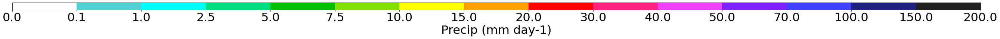

STV

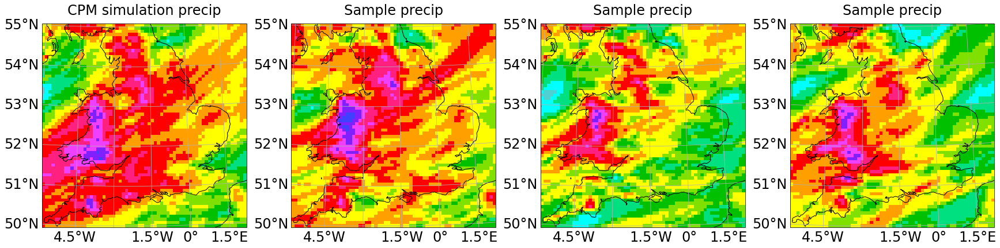

STV No scalers

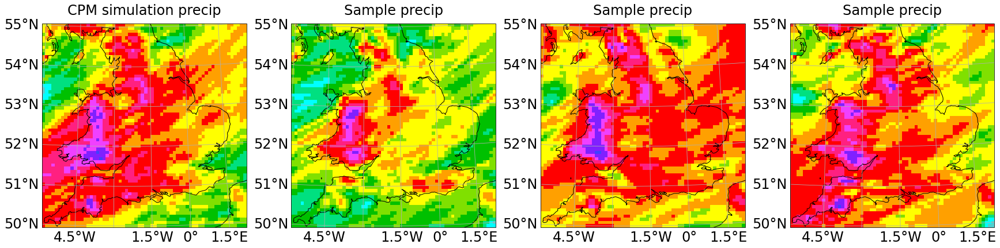

STV Shuffled Fix CP 20

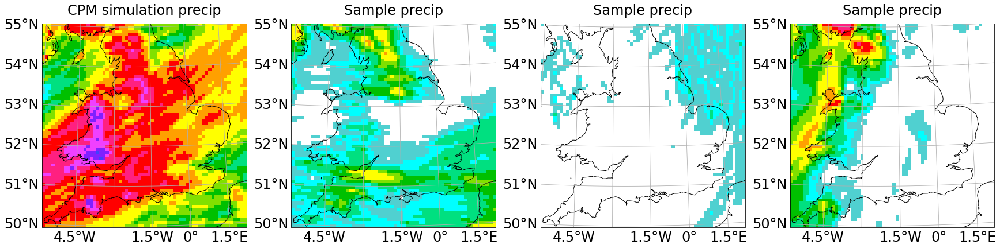

STV850

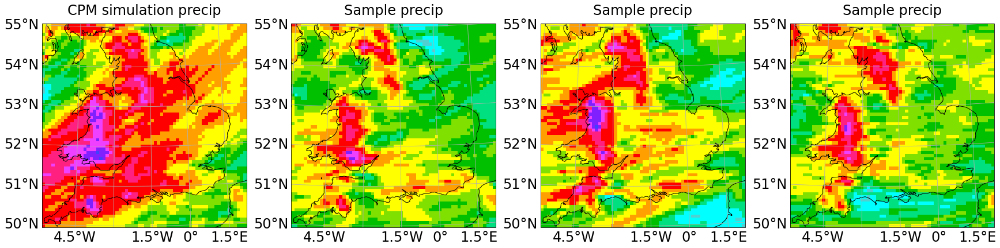

V850

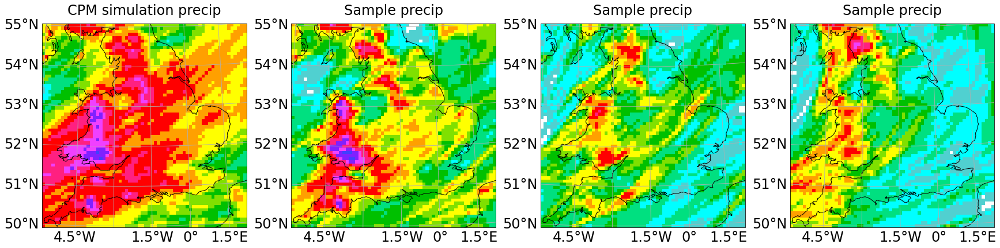

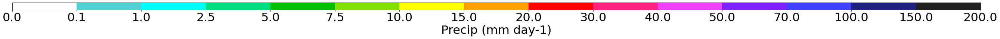

STV

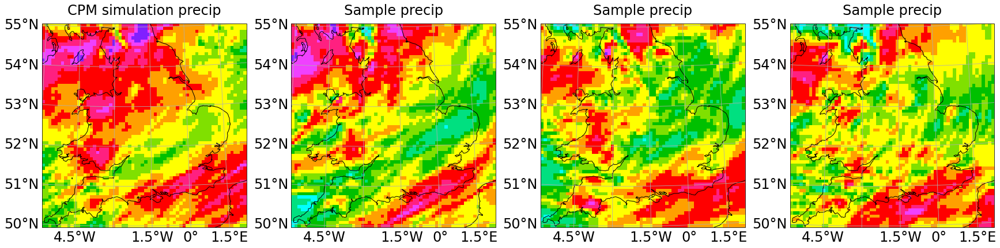

STV No scalers

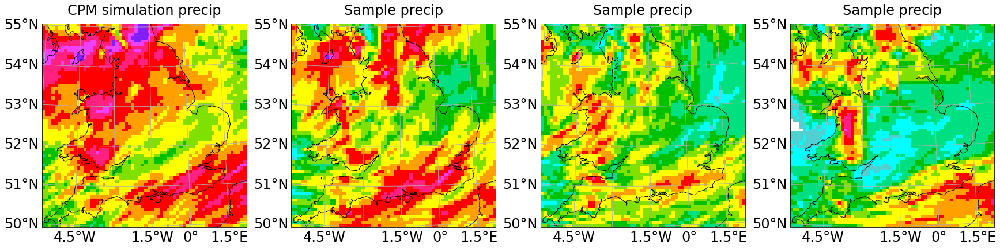

STV Shuffled Fix CP 20

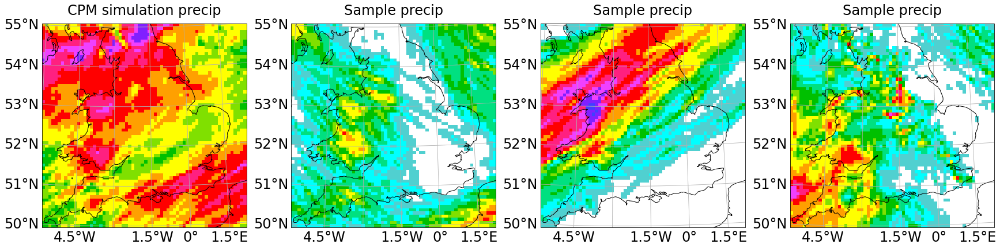

STV850

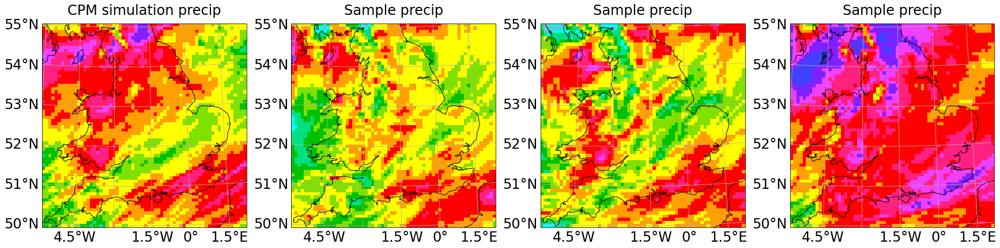

V850

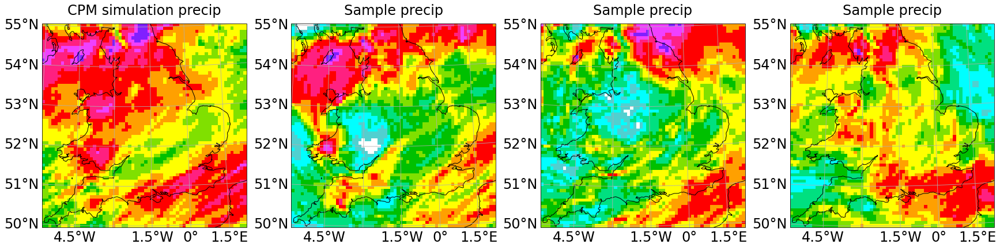

GCM

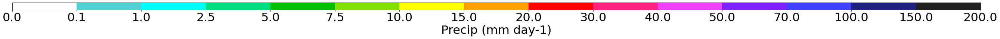

STV

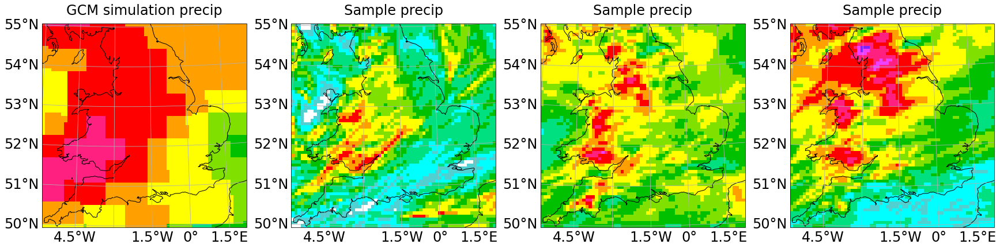

STV No scalers

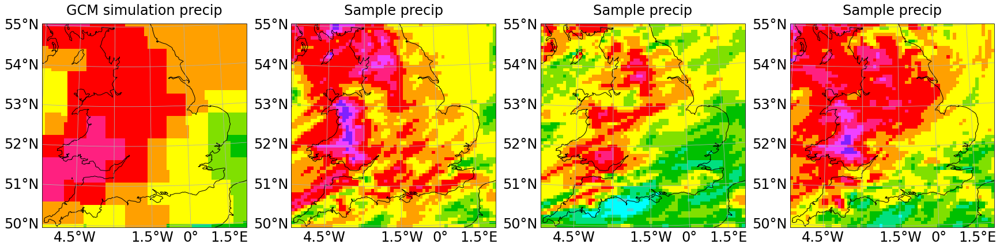

STV Shuffled Fix CP 20

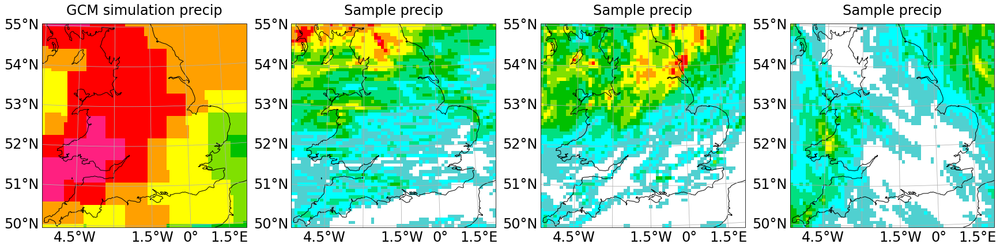

STV850

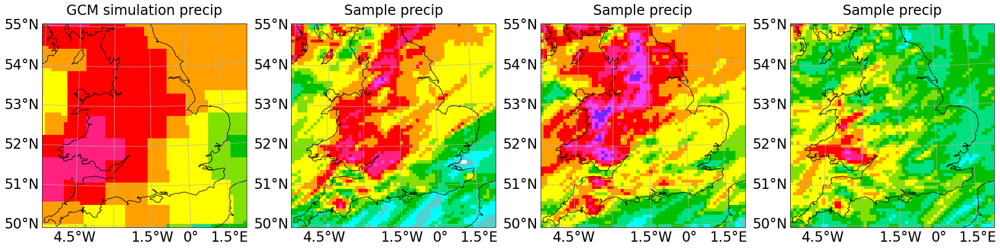

V850

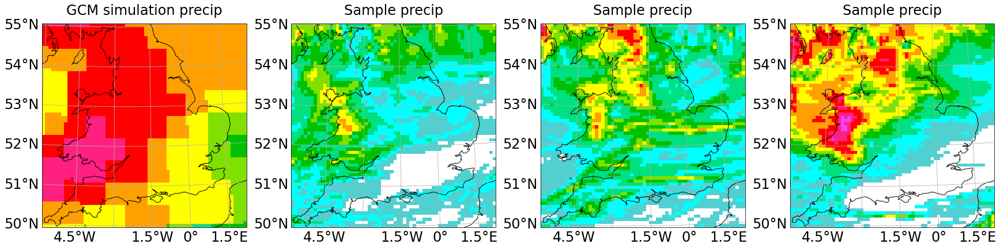

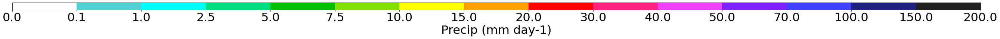

STV

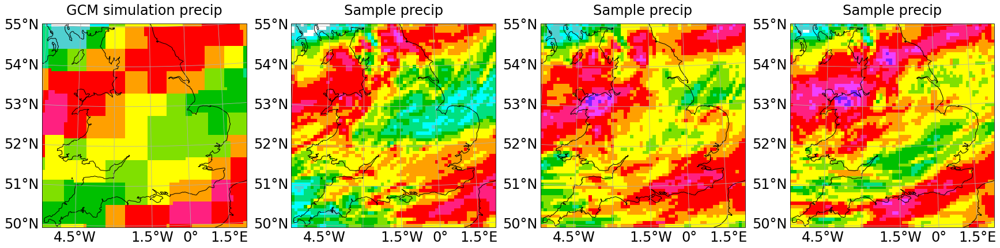

STV No scalers

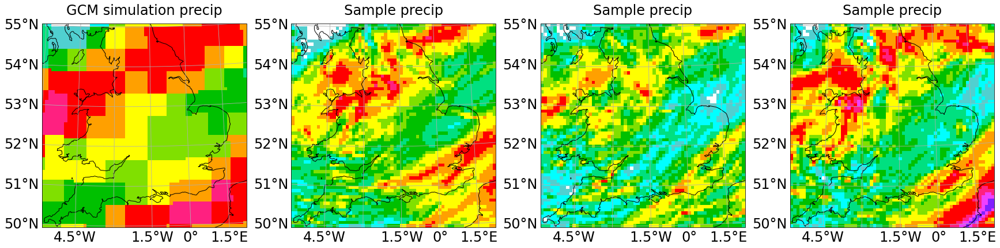

STV Shuffled Fix CP 20

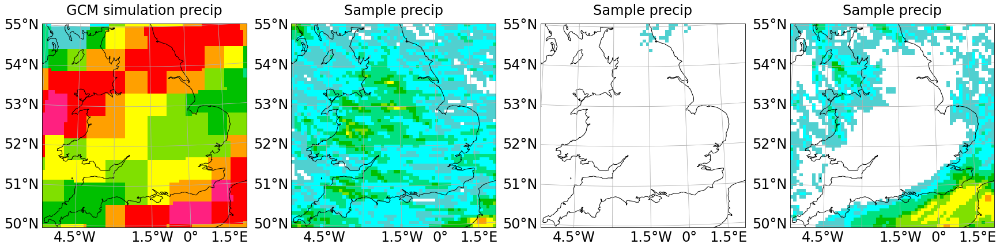

STV850

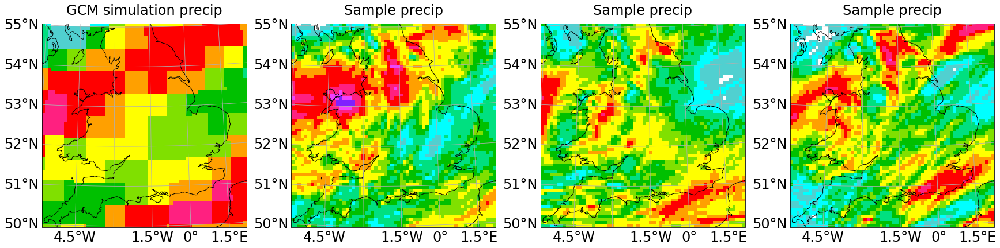

V850

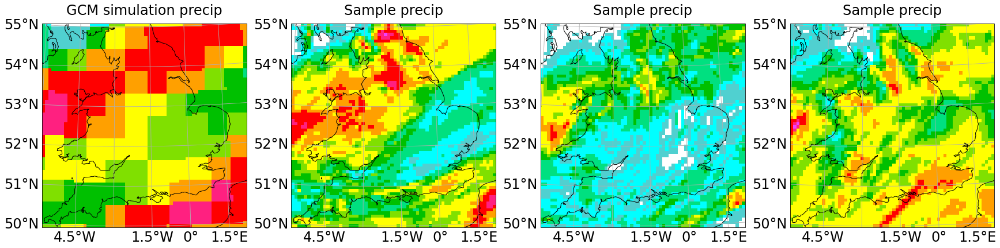

Timestep chunk 1

CPM

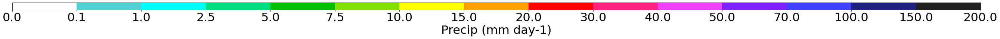

STV

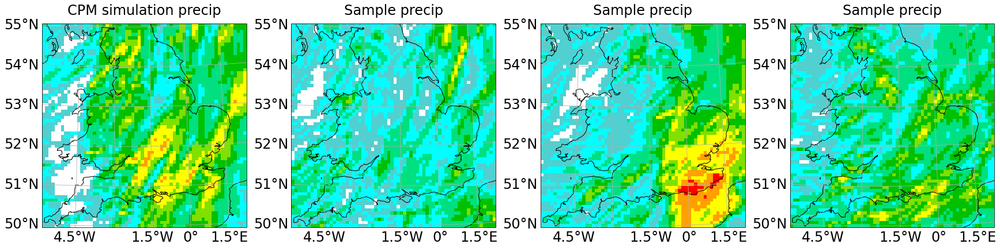

STV No scalers

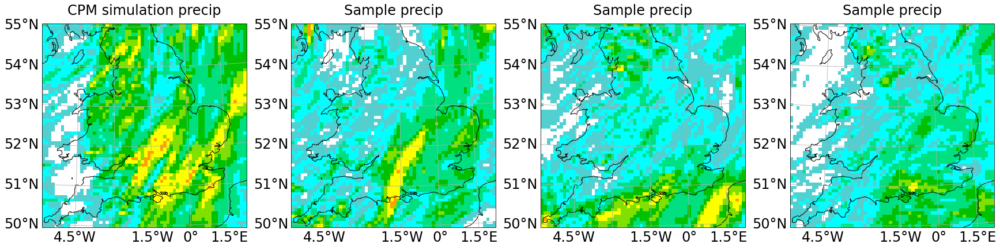

STV Shuffled Fix CP 20

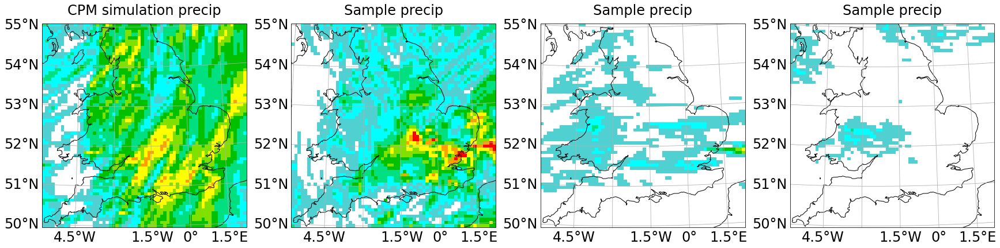

STV850

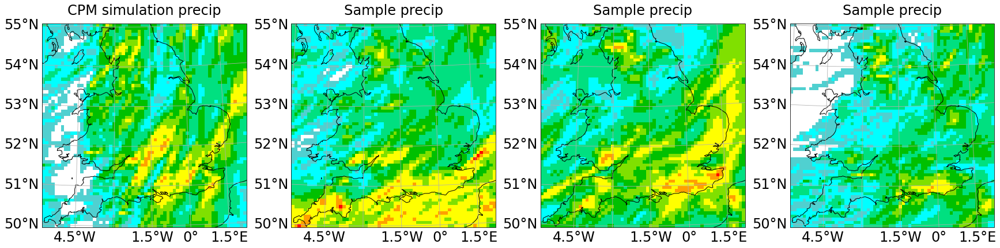

V850

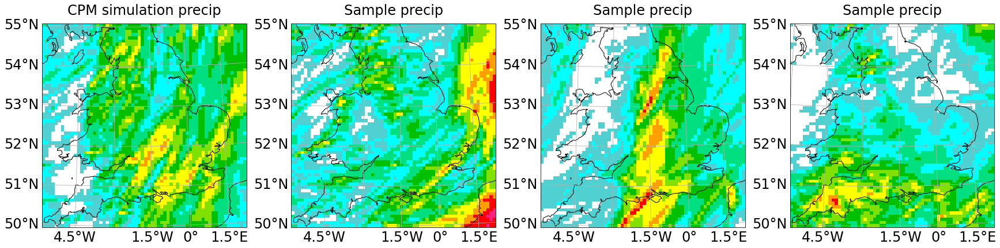

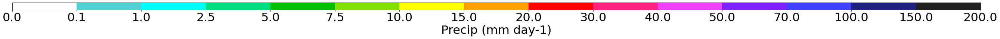

STV

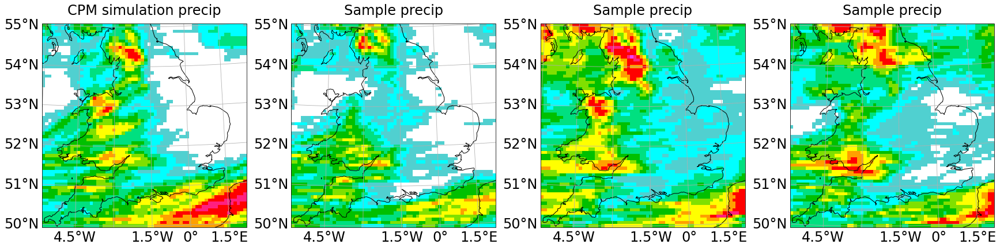

STV No scalers

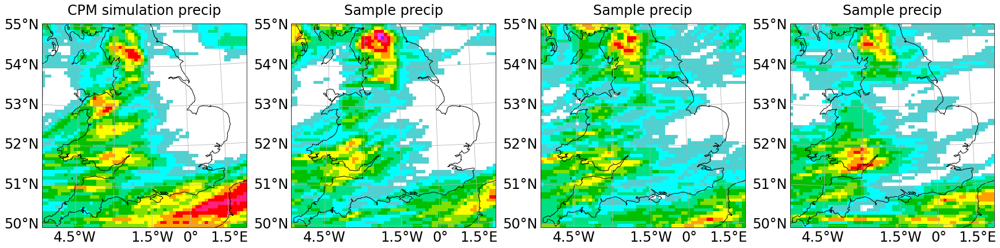

STV Shuffled Fix CP 20

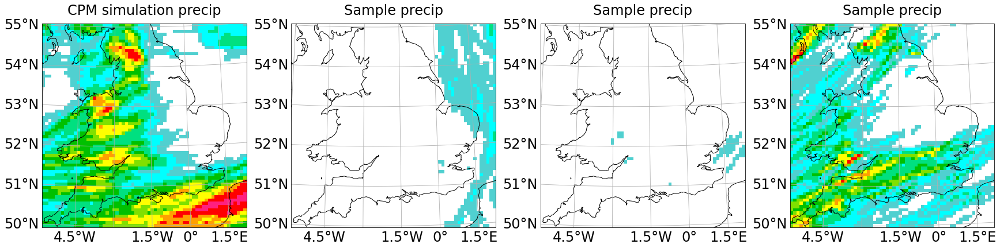

STV850

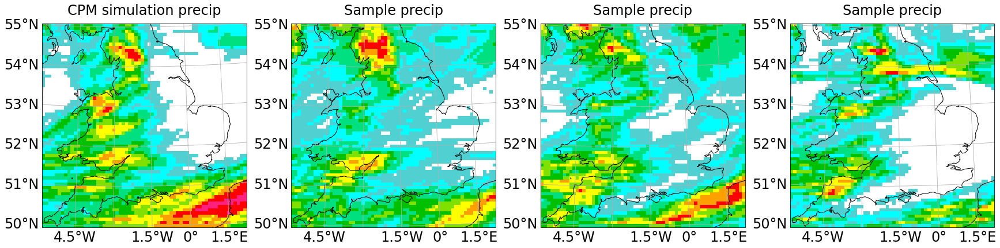

V850

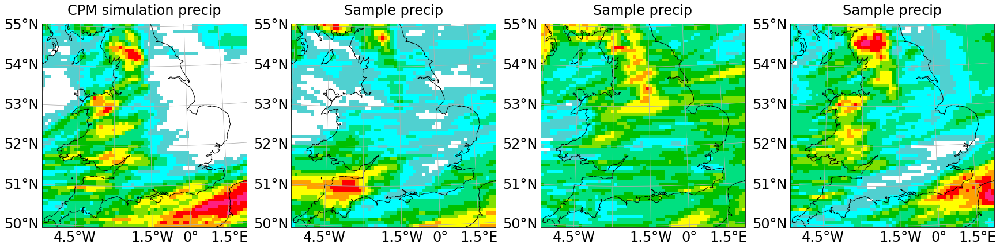

GCM

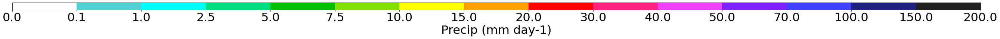

STV

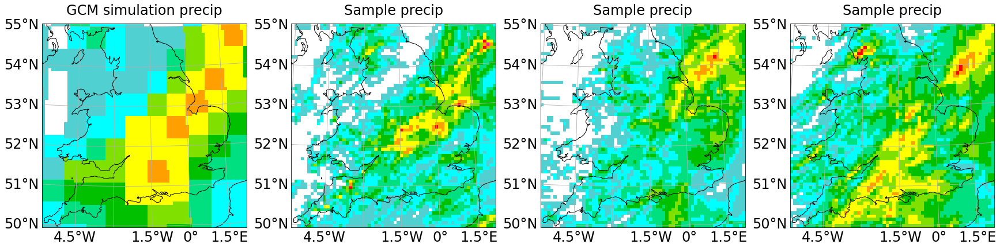

STV No scalers

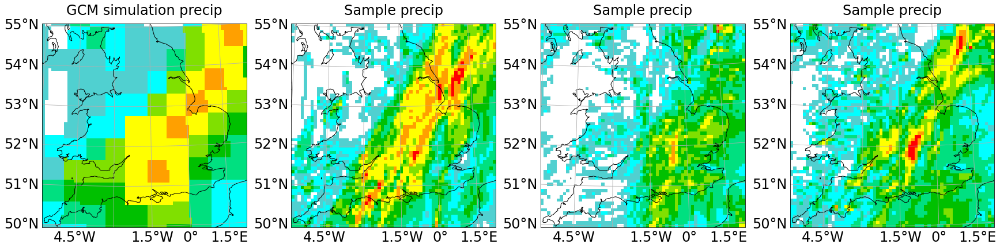

STV Shuffled Fix CP 20

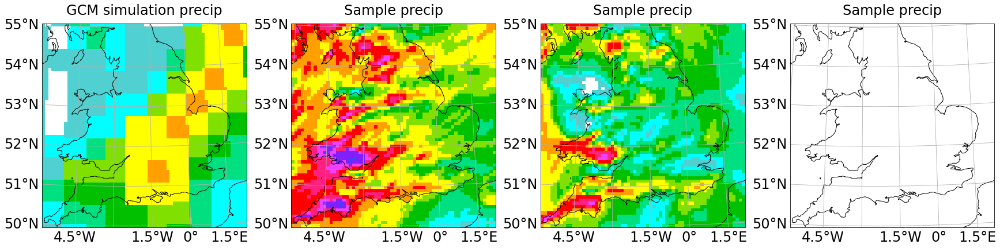

STV850

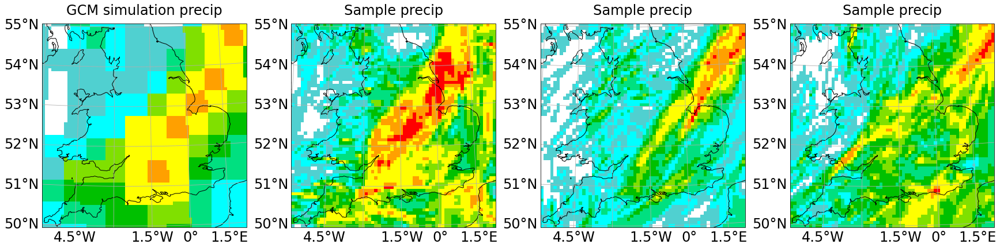

V850

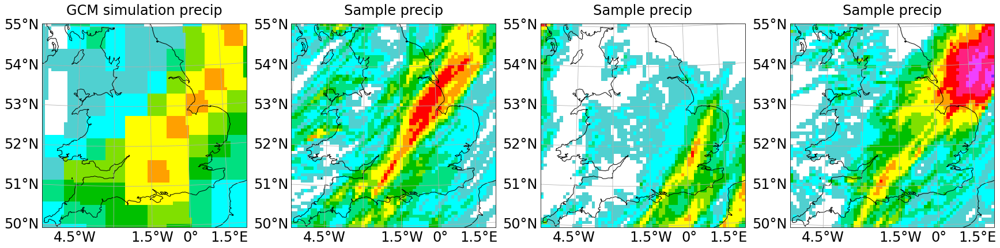

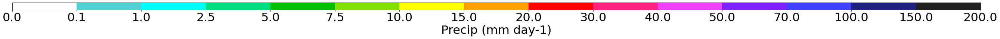

STV

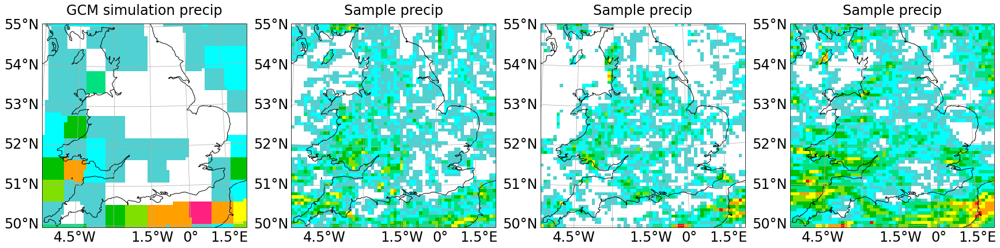

STV No scalers

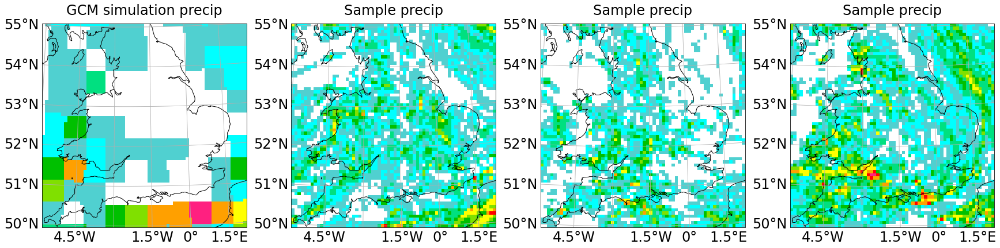

STV Shuffled Fix CP 20

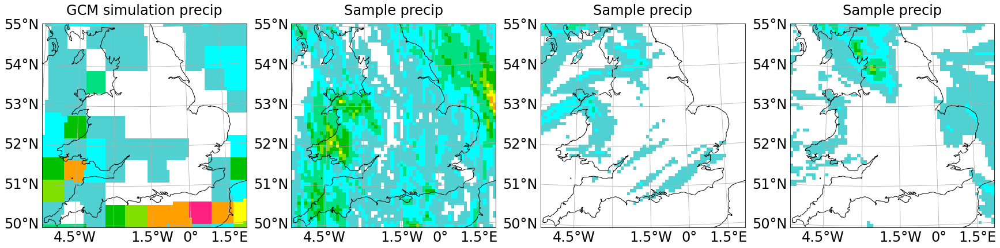

STV850

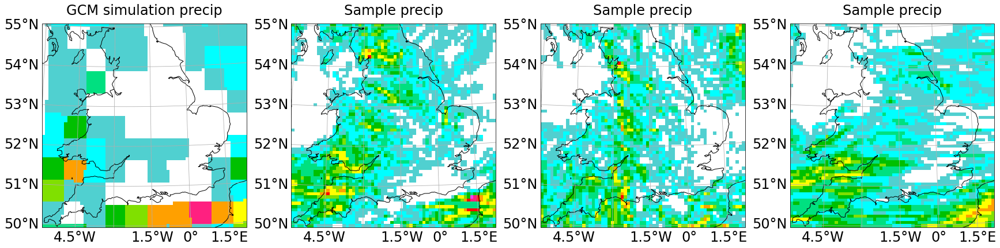

V850

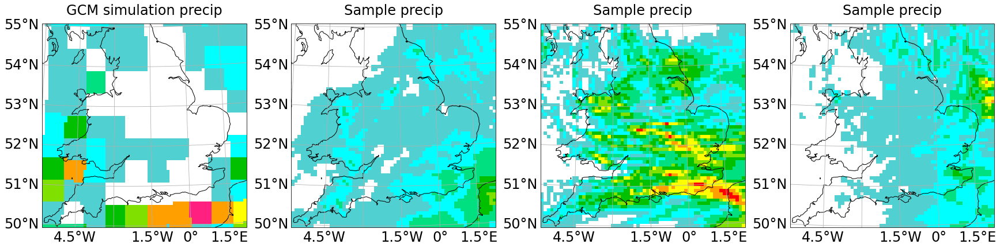

In [8]:
timestamp_chunks = [
    sorted_time[t:t+2] for t in [
        -20, 
        # math.ceil(len(sorted_time)*0.9),
        math.ceil(len(sorted_time)*0.81),
        # math.ceil(len(sorted_time)*0.5), 
        # 17
    ]
]
# timestamps = np.random.choice(sorted_time, size=2*3, replace=False)

for i, timestamps in enumerate(timestamp_chunks):
    IPython.display.display_html(f"<h1>Timestep chunk {i}</h1>", raw=True)
    show_samples(merged_ds, timestamps)

## Frequency distribution

### Pixel

CPM

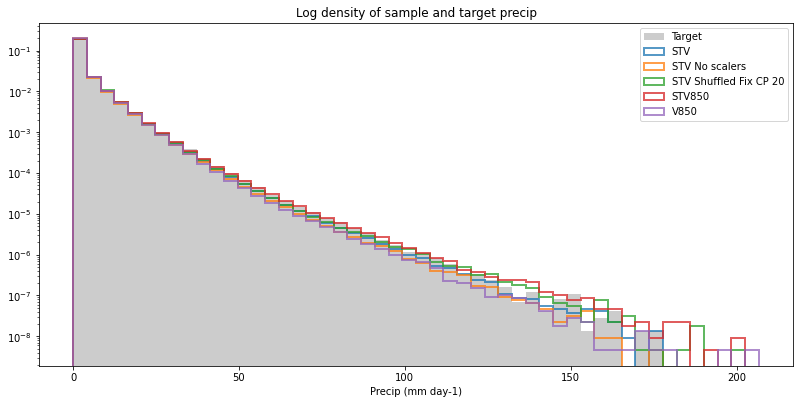

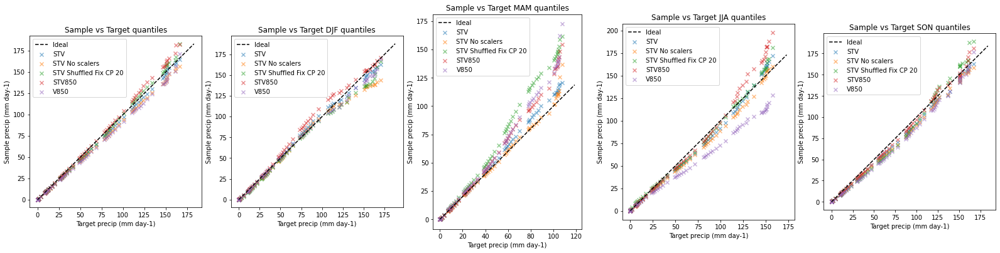

GCM

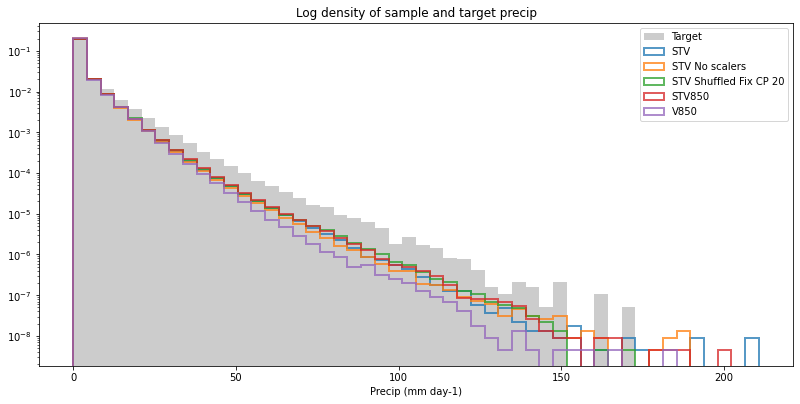

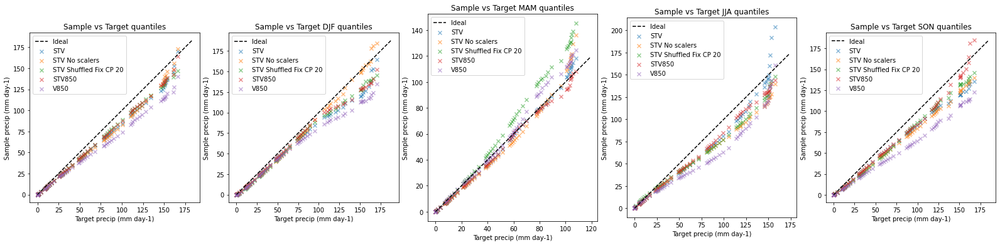

In [9]:
# quantiles = np.concatenate([np.linspace(0.1,0.9,9), np.linspace(0.91,0.99,9), np.linspace(0.991,0.999,9), 0.9999999])
quantiles = np.concatenate([np.linspace((1-10**(i+1))+(10**i), (1-10**i), 9) for i in range(-1, -8, -1)])

distribution_figure(merged_ds, quantiles, "Distribution of pixel values")

### Mean over space

CPM

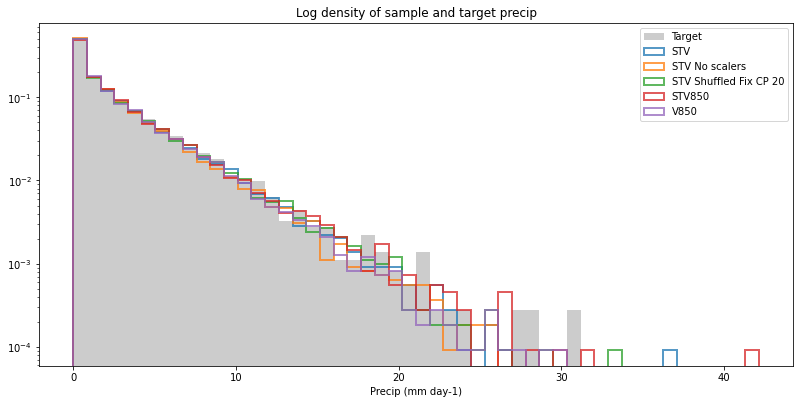

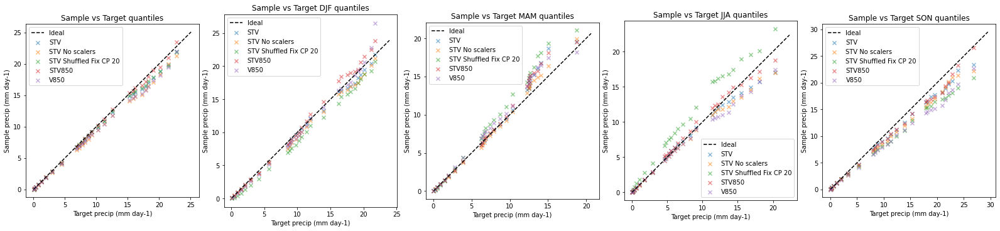

GCM

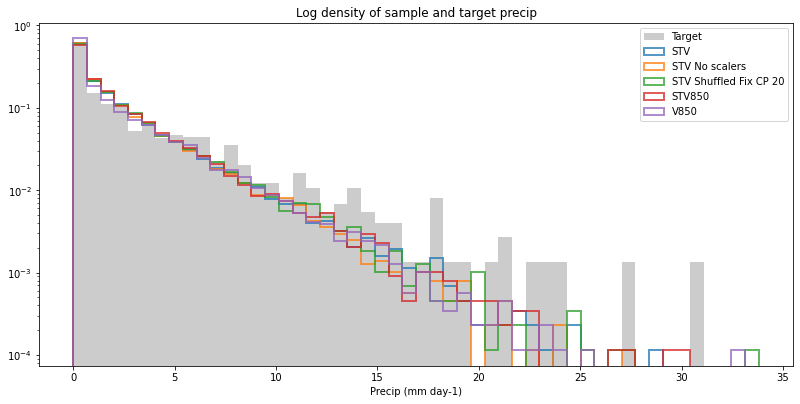

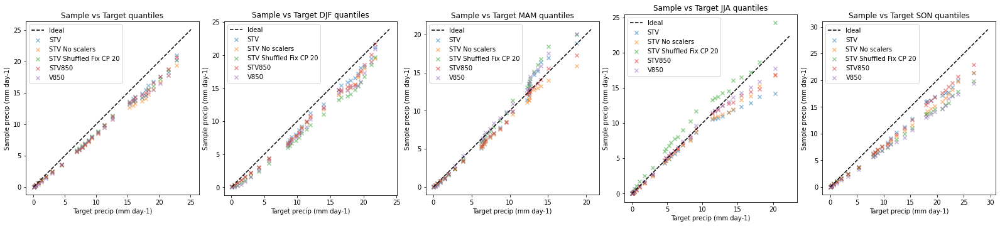

In [10]:
quantiles = np.concatenate([np.linspace(0.1,0.8,8), np.linspace(0.9,0.99,10), np.linspace(0.991,0.999,9)])

distribution_figure(merged_ds[["target_pr", "pred_pr"]].mean(dim=["grid_longitude", "grid_latitude"]), quantiles, "Distribution of mean precip over space")

## Bias

Bias/Target mean

All

CPM

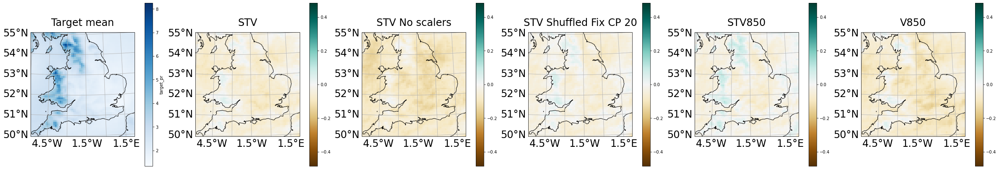

GCM

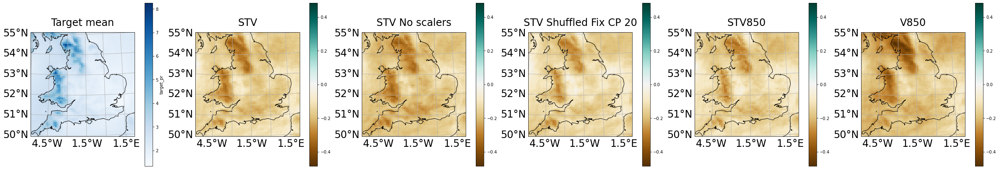

Season DJF

CPM

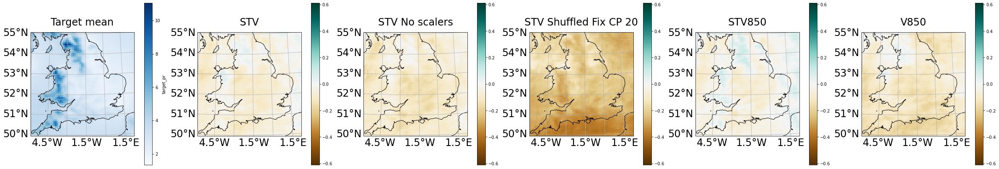

GCM

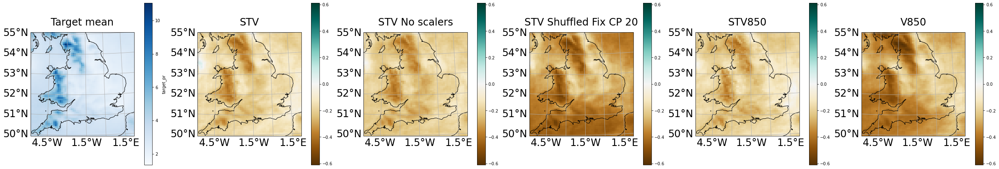

Season JJA

CPM

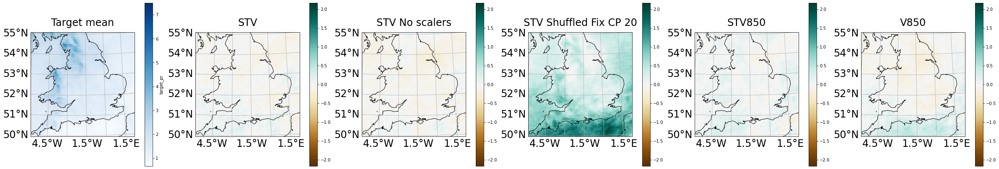

GCM

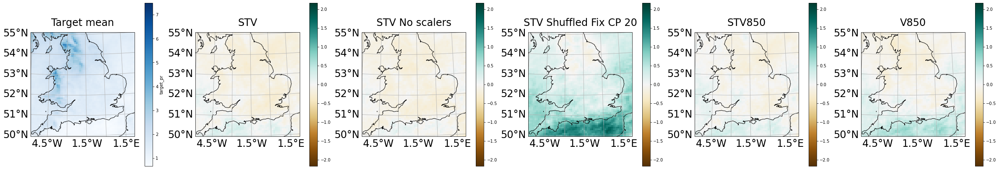

Season MAM

CPM

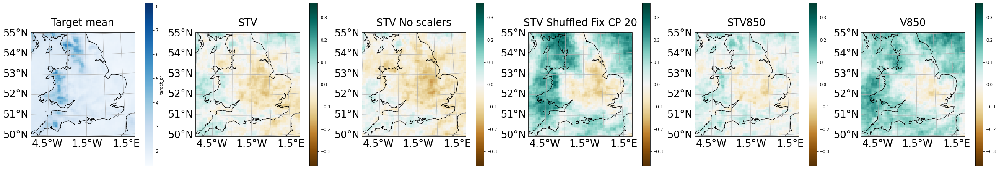

GCM

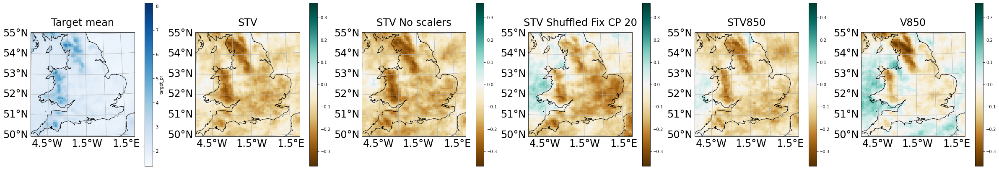

Season SON

CPM

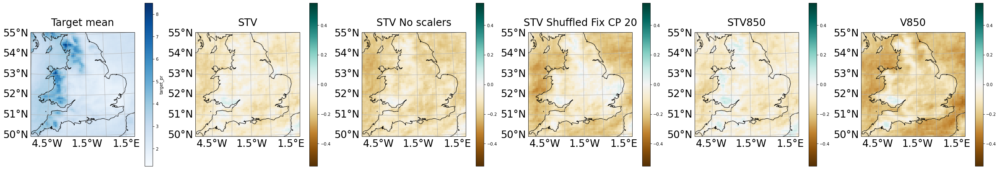

GCM

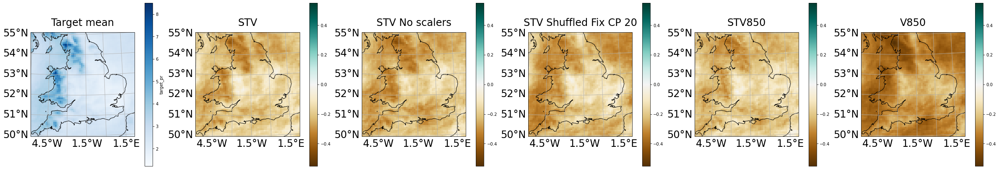

In [11]:
plot_mean_bias(merged_ds)

## Standard deviation

CPM

STV

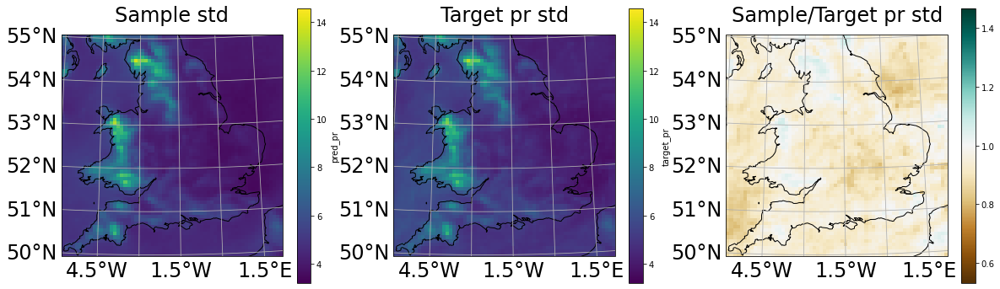

STV No scalers

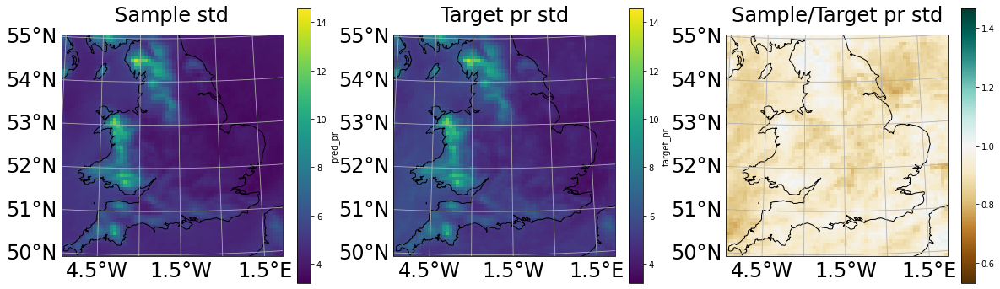

STV Shuffled Fix CP 20

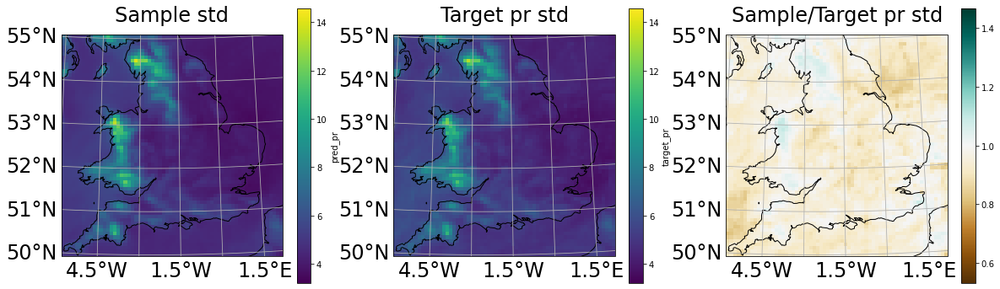

STV850

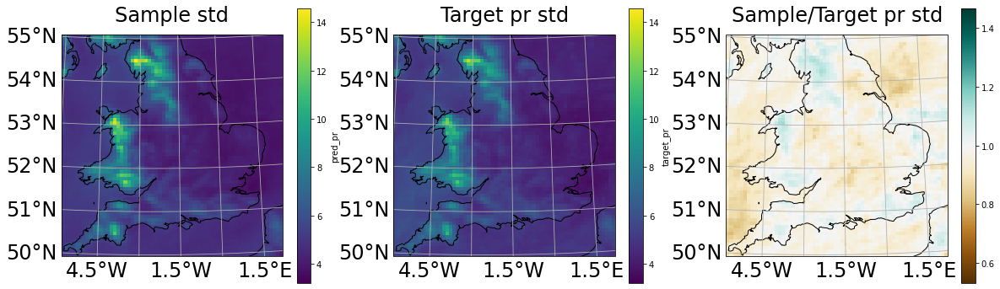

V850

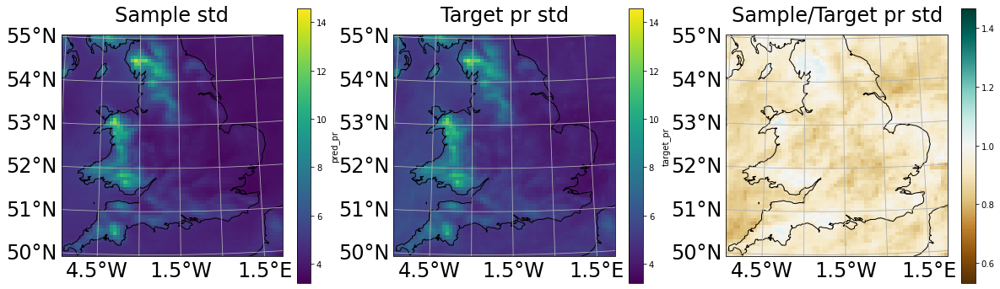

GCM

STV

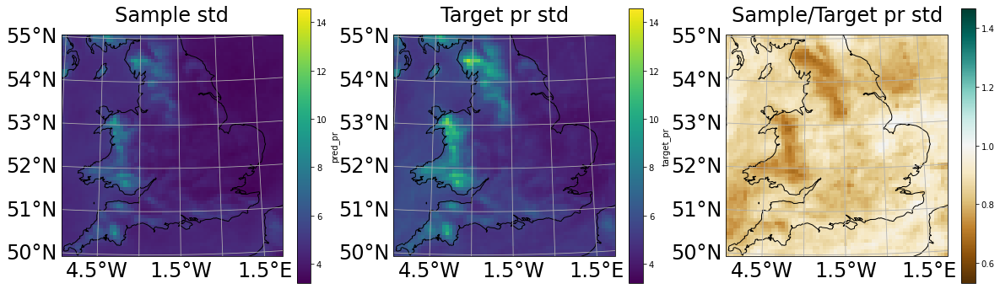

STV No scalers

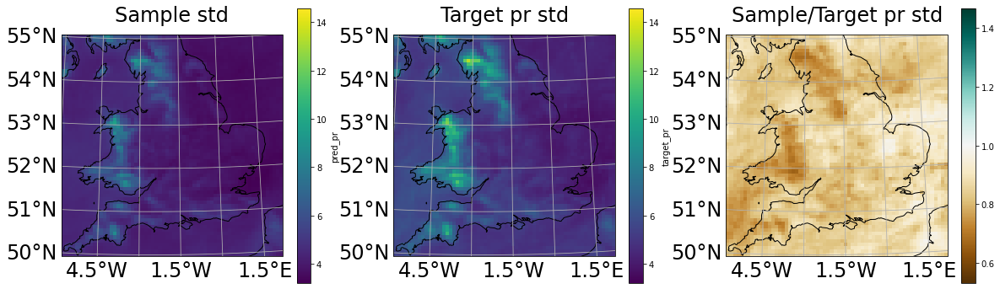

STV Shuffled Fix CP 20

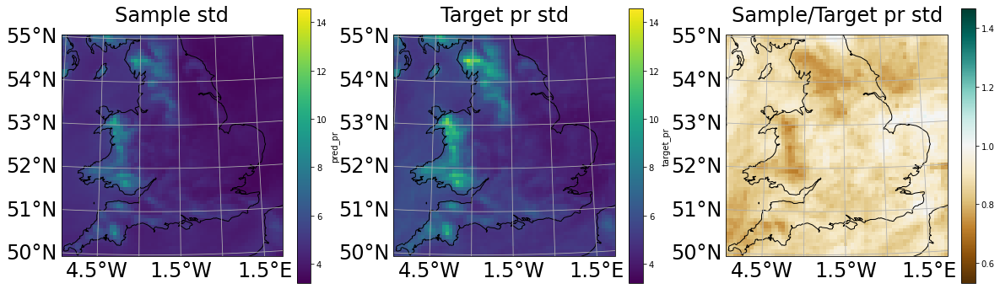

STV850

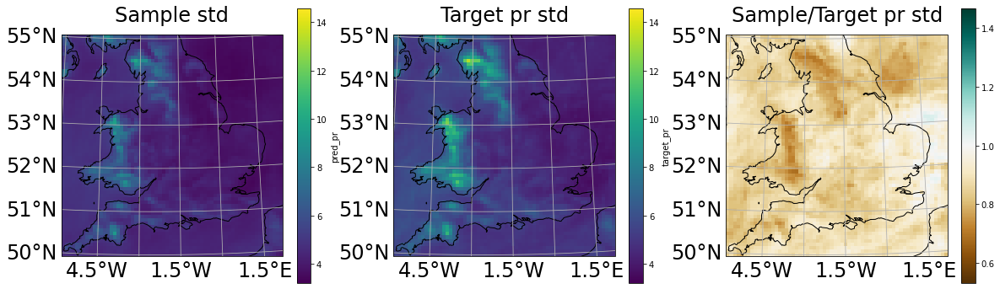

V850

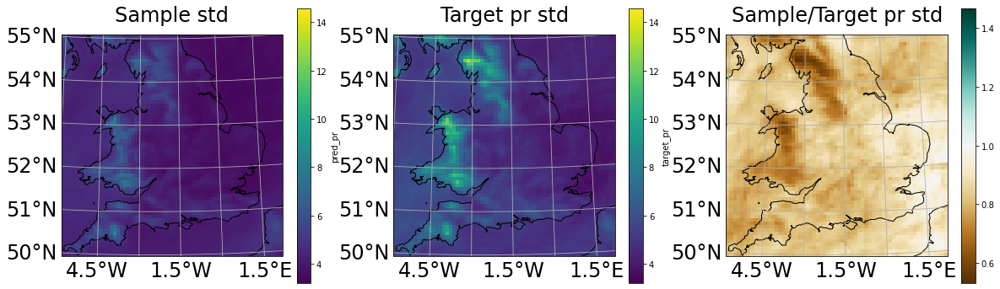

In [12]:
plot_std(merged_ds)

## Scatter

In [13]:
# fig, axs = plt.subplots(1, 1, figsize=(20, 6))

# tr = min(merged_ds["pred_pr"].max(), merged_ds["target_pr"].max())


# ax = axs

# ax.scatter(x=merged_ds["pred_pr"], y=merged_ds["target_pr"].values[None, :].repeat(len(merged_ds["sample_id"]), 0), alpha=0.05)
# ax.plot([0, tr], [0, tr], linewidth=1, color='green')


In [14]:
# sample_ids = np.arange(9).reshape(3, 3)

# fig, axs = plt.subplots(sample_ids.shape[0], sample_ids.shape[1], figsize=(30, 12))

# tr = min(merged_ds["pred_pr"].max(), merged_ds["target_pr"].max())

# for i, sample_id in enumerate(sample_ids.flatten()):
#     ax = axs[i//3][i%3]

#     ax.scatter(x=merged_ds["pred_pr"].sel(sample_id=sample_id), y=merged_ds["target_pr"], alpha=0.1)
#     ax.plot([0, tr], [0, tr], linewidth=1, color='green')
#     ax.set_xlabel(f"Sample {sample_id} pr")
#     ax.set_ylabel(f"Target pr")
    
# plt.show()

In [15]:
# fig, axs = plt.subplots(1, 1, figsize=(20, 6))

# tr = min(total_pred_pr.max(), total_target_pr.max())

# ax = axs

# ax.scatter(x=total_pred_pr, y=total_target_pr.values[None, :].repeat(len(total_pred_pr["sample_id"]), 0), alpha=0.25)
# ax.plot([0, tr], [0, tr], linewidth=1, color='green')

# plt.show()

## PSD

## Correlation